<a href="https://colab.research.google.com/github/audwls4545/metaverse/blob/main/orange_resnet34_version_1_and_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install koreanize-matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 69.5 MB/s eta 0:00:00


In [2]:
import matplotlib.pyplot as plt
import koreanize_matplotlib

In [3]:
!git clone https://github.com/ndb796/bing_image_downloader

Cloning into 'bing_image_downloader'...
remote: Enumerating objects: 86, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 86 (delta 17), reused 10 (delta 10), pack-reused 64
Unpacking objects: 100% (86/86), 17.48 KiB | 715.00 KiB/s, done.


In [4]:
import os
import shutil
from bing_image_downloader.bing_image_downloader import downloader

directory_list = [
    './dataset/train/',
    './dataset/test/'
]

for dir in directory_list:
    if not os.path.isdir(dir):
        os.makedirs(dir)

In [5]:
downloader.download('귤',limit=100,output_dir='./',adult_filter_off=True, force_replace=False, timeout=60 )
downloader.download('천혜향',limit=100,output_dir='./',adult_filter_off=True, force_replace=False, timeout=60 )
downloader.download('한라봉',limit=100,output_dir='./',adult_filter_off=True, force_replace=False, timeout=60 )
downloader.download('레드향',limit=100,output_dir='./',adult_filter_off=True, force_replace=False, timeout=60 )
downloader.download('자몽',limit=100,output_dir='./',adult_filter_off=True, force_replace=False, timeout=60 )

[Info] Indexing page: 1
[Info] Indexed 35 Images on Page 1.
#1 이미지 다운로드 (https://vignette.wikia.nocookie.net/nutri/images/7/73/귤.jpg/revision/latest?cb=20170502162853&amp;path-prefix=ko)
[Info] Issue getting: https://vignette.wikia.nocookie.net/nutri/images/7/73/귤.jpg/revision/latest?cb=20170502162853&amp;path-prefix=ko
[Error] 'ascii' codec can't encode character '\uade4' in position 23: ordinal not in range(128)
#1 이미지 다운로드 (https://cdn.pixabay.com/photo/2015/08/16/11/50/tangerines-890799_960_720.jpg)
#1 파일 다운로드가 완료되었습니다.
#2 이미지 다운로드 (https://ko.matsuyama-sightseeing.com/wp-content/uploads/2019/09/36-3.jpg)
#2 파일 다운로드가 완료되었습니다.
#3 이미지 다운로드 (https://img.lovepik.com/element/40088/7122.png_860.png)
#3 파일 다운로드가 완료되었습니다.
#4 이미지 다운로드 (https://img.lovepik.com/element/40075/4787.png_860.png)
#4 파일 다운로드가 완료되었습니다.
#5 이미지 다운로드 (http://t1.daumcdn.net/liveboard/realfood/b7fdb6a2fbba4f7b866fafe2d43c1907.JPG)
#5 파일 다운로드가 완료되었습니다.
#6 이미지 다운로드 (https://pixnio.com/free-images/2018/08/21/2018-08-21-21-

In [6]:
#수집한 이미지를 학습데이터 평가데이터로 구분하는 함수
def dataset_split(query,train_cnt):

    for dir in directory_list:
        if not os.path.isdir(dir+query):
            os.makedirs(dir+query)

    cnt = 0
    for file_name in os.listdir(query):
        if cnt < train_cnt:
            print(f'trainset : {file_name}')
            shutil.move(query+'/'+file_name,'./dataset/train/'+query+'/'+file_name)
        else:
            print(f'testset : {file_name}')
            shutil.move(query+'/'+file_name,'./dataset/test/'+query+'/'+file_name)

        cnt += 1

    shutil.rmtree(query)

In [7]:
dataset_split('귤',85)
dataset_split('천혜향',85)
dataset_split('한라봉',85)
dataset_split('레드향',85)
dataset_split('자몽',85)

trainset : image_34.png
trainset : image_75.jpg
trainset : image_1.jpg
trainset : image_11.jpg
trainset : image_56.jpg
trainset : image_17.jpg
trainset : image_7.jpg
trainset : image_51.jpg
trainset : image_35.png
trainset : image_82.jpg
trainset : image_18.jpg
trainset : image_70.jpg
trainset : image_96.png
trainset : image_12.jpg
trainset : image_36.JPG
trainset : image_3.png
trainset : image_84.JPG
trainset : image_55.jpg
trainset : image_27.jpg
trainset : image_89.jpg
trainset : image_4.png
trainset : image_65.png
trainset : image_90.jpg
trainset : image_81.jpg
trainset : image_33.jpg
trainset : image_32.jpg
trainset : image_20.jpg
trainset : image_43.jpg
trainset : image_24.jpg
trainset : image_62.jpg
trainset : image_88.jpg
trainset : image_22.JPG
trainset : image_9.png
trainset : image_91.jpeg
trainset : image_57.jpg
trainset : image_5.JPG
trainset : image_95.jpg
trainset : image_100.jpg
trainset : image_39.jpg
trainset : image_19.jpg
trainset : image_21.jpg
trainset : image_60.

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, models, transforms
import numpy as np
import time

In [9]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [10]:
transform_train = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

In [11]:
train_datasets = datasets.ImageFolder('./dataset/train',transform_train)
test_datasets = datasets.ImageFolder('./dataset/test',transform_test)

In [12]:
train_dataloader = torch.utils.data.DataLoader(train_datasets,shuffle=True,batch_size=4)
test_dataloader = torch.utils.data.DataLoader(test_datasets,shuffle=True,batch_size=4)

In [13]:
def imshow(img, title):
    print(img.numpy().shape) #tensor를 numpy로 변환
    img = img.numpy().transpose((1,2,0)) #w,h,c

    std = np.array([0.229,0.224,0.225])
    mean = np.array([0.485,0.456,0.406])

    img = std * img + mean
    img = np.clip(img,0,1)

    plt.imshow(img)
    plt.title(title)
    plt.show()

In [14]:
class_names = train_datasets.classes
print('클래스:', class_names)

클래스: ['귤', '레드향', '자몽', '천혜향', '한라봉']


(3, 228, 906)


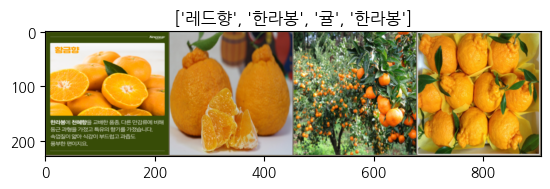

In [15]:
iter_ = iter(train_dataloader)

data, labels = next(iter_)
out = torchvision.utils.make_grid(data)

imshow(out,title=[class_names[x] for x in labels])

In [16]:
model = models.resnet34(pretrained=True)
print(model)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 360MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [17]:
for param in model.parameters():
    param.requires_grad = False

In [18]:
fc_input_features = model.fc.in_features
fc_input_features

512

In [19]:
model.fc = nn.Linear(fc_input_features, 5)

for name,module in model.named_parameters():
    print(name , module.requires_grad)

conv1.weight False
bn1.weight False
bn1.bias False
layer1.0.conv1.weight False
layer1.0.bn1.weight False
layer1.0.bn1.bias False
layer1.0.conv2.weight False
layer1.0.bn2.weight False
layer1.0.bn2.bias False
layer1.1.conv1.weight False
layer1.1.bn1.weight False
layer1.1.bn1.bias False
layer1.1.conv2.weight False
layer1.1.bn2.weight False
layer1.1.bn2.bias False
layer1.2.conv1.weight False
layer1.2.bn1.weight False
layer1.2.bn1.bias False
layer1.2.conv2.weight False
layer1.2.bn2.weight False
layer1.2.bn2.bias False
layer2.0.conv1.weight False
layer2.0.bn1.weight False
layer2.0.bn1.bias False
layer2.0.conv2.weight False
layer2.0.bn2.weight False
layer2.0.bn2.bias False
layer2.0.downsample.0.weight False
layer2.0.downsample.1.weight False
layer2.0.downsample.1.bias False
layer2.1.conv1.weight False
layer2.1.bn1.weight False
layer2.1.bn1.bias False
layer2.1.conv2.weight False
layer2.1.bn2.weight False
layer2.1.bn2.bias False
layer2.2.conv1.weight False
layer2.2.bn1.weight False
layer2.2.bn1

In [20]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
model.to(device)
start_time = time.time()
for epoch in range(50):
    for data,labels in train_dataloader:
        optimizer.zero_grad()
        preds = model(data.to(device))
        loss = nn.CrossEntropyLoss()(preds,labels.to(device).data)
        loss.backward()
        optimizer.step()

    print(f'epoch : {epoch+1} loss : {loss.item()} time : {time.time() - start_time}')


epoch : 1 loss : 1.6376042366027832 time : 24.038461208343506
epoch : 2 loss : 1.5867465734481812 time : 39.53991770744324
epoch : 3 loss : 1.5117032527923584 time : 55.310558795928955
epoch : 4 loss : 1.6264805793762207 time : 71.781498670578
epoch : 5 loss : 1.686135172843933 time : 88.4729368686676
epoch : 6 loss : 1.5471348762512207 time : 104.01197481155396
epoch : 7 loss : 1.4149279594421387 time : 120.57813167572021
epoch : 8 loss : 1.4949347972869873 time : 136.2866187095642
epoch : 9 loss : 1.5372834205627441 time : 152.08559560775757
epoch : 10 loss : 1.7495999336242676 time : 168.0626084804535
epoch : 11 loss : 1.6679441928863525 time : 184.12559700012207
epoch : 12 loss : 1.564152479171753 time : 199.88920140266418
epoch : 13 loss : 1.8235543966293335 time : 215.4539942741394
epoch : 14 loss : 1.56779146194458 time : 232.0526852607727
epoch : 15 loss : 1.6197946071624756 time : 258.04198813438416
epoch : 16 loss : 1.4730933904647827 time : 275.73739647865295
epoch : 17 loss

In [21]:
torch.save(model.state_dict(),'orange-resnet34.pth')

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


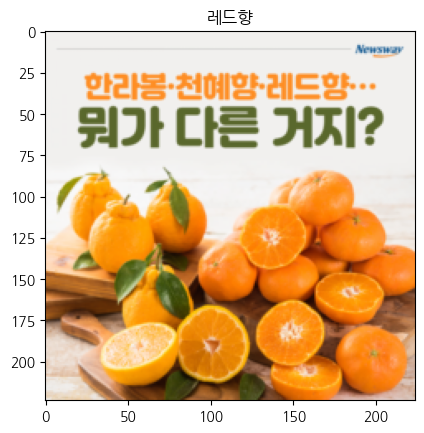

예측결과 : 레드향  실제정답 : 천혜향
(3, 224, 224)


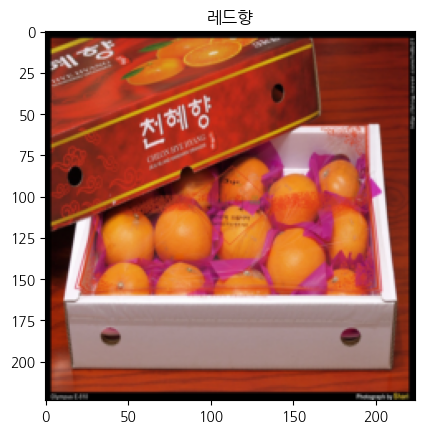

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


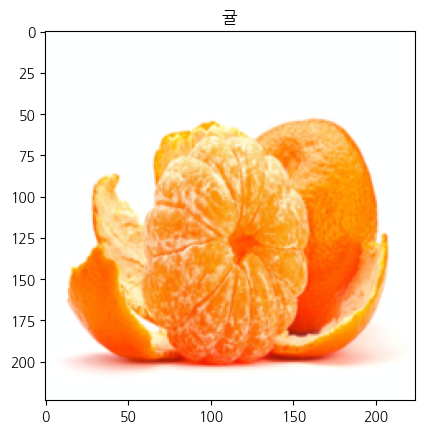

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


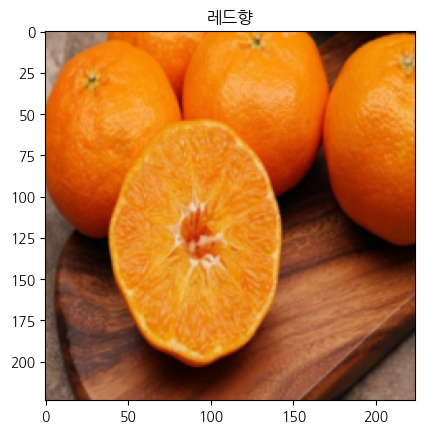

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


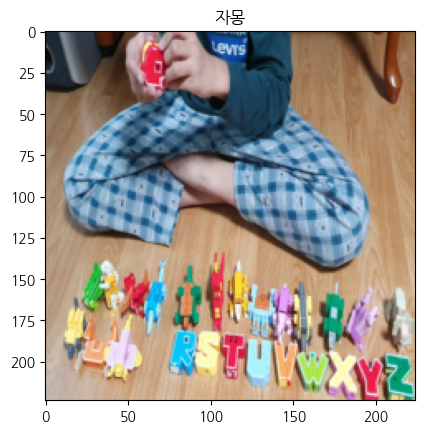

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


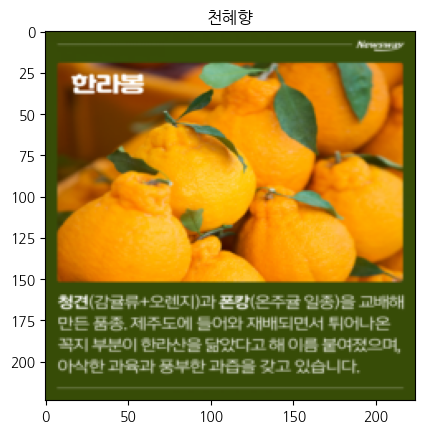

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


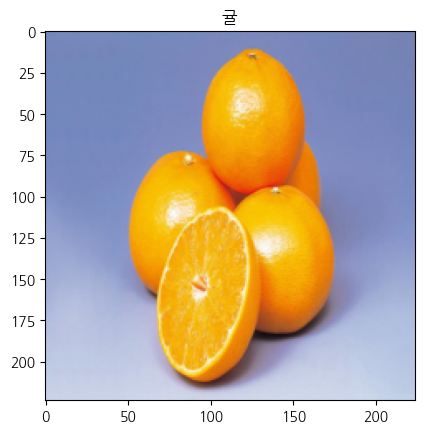

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


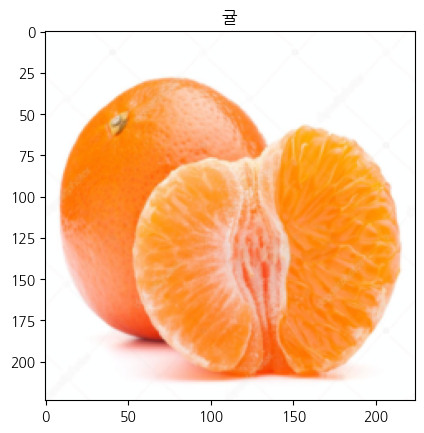

예측결과 : 귤  실제정답 : 한라봉
(3, 224, 224)


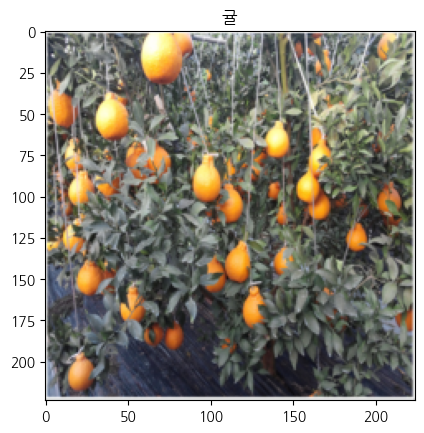

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


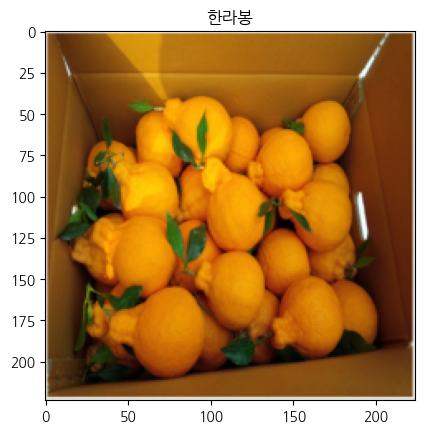

예측결과 : 레드향  실제정답 : 한라봉
(3, 224, 224)


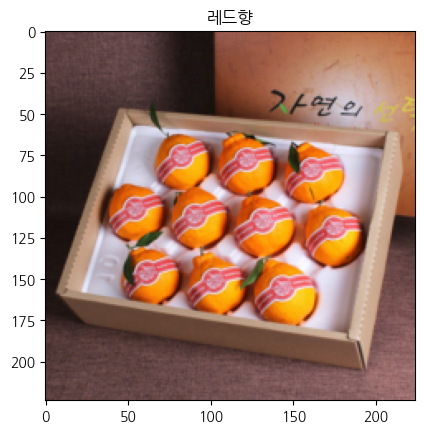

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


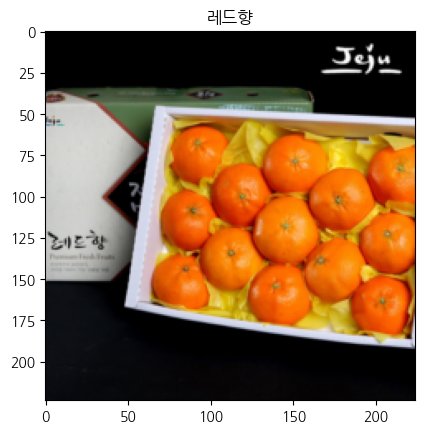

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


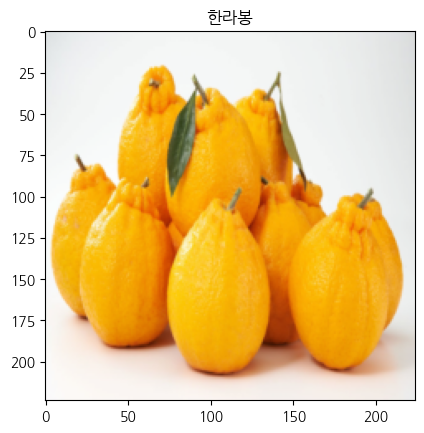

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


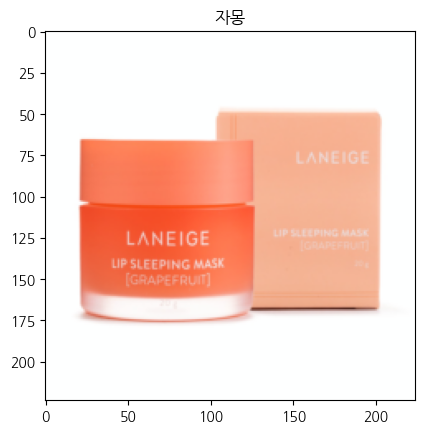

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


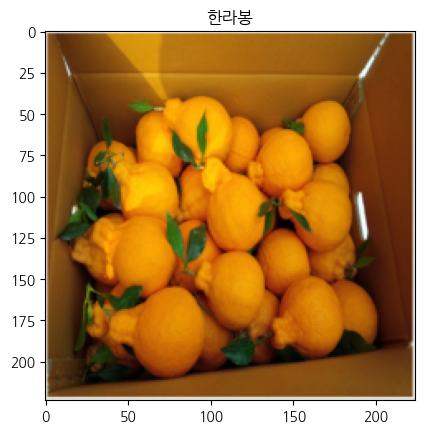

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


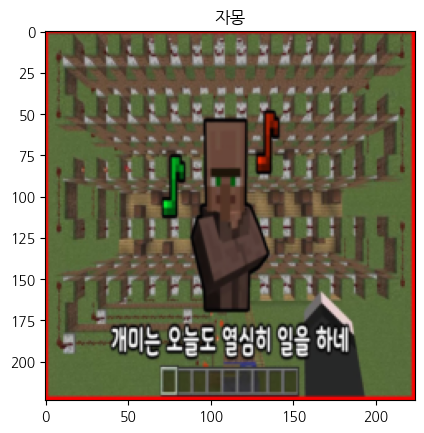

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


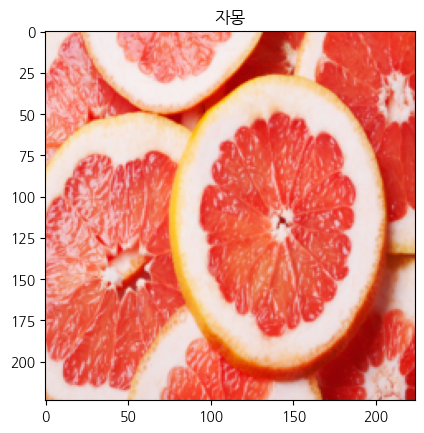

예측결과 : 자몽  실제정답 : 레드향
(3, 224, 224)


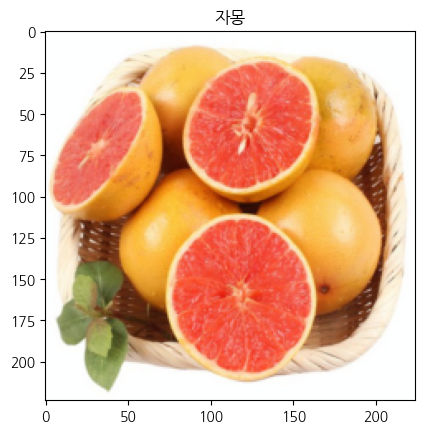

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


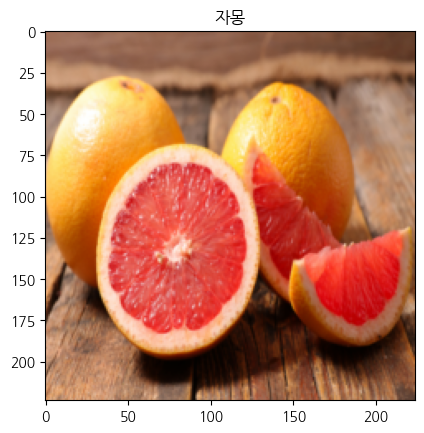

정확도 : 74.32432556152344


In [22]:
model.eval()

with torch.no_grad():
    corrects = 0
    for data,labels in test_dataloader:
        preds = model(data.to(device))
        pred = torch.max(preds,1)[1]

        corrects += torch.sum(pred == labels.to(device).data)

        print(f'예측결과 : {class_names[pred[0]]}  실제정답 : {class_names[labels.data[0]]}')
        imshow(data.cpu().data[0], title=class_names[pred[0]])

    acc = corrects / len(test_datasets) * 100
    print(f'정확도 : {acc}')

In [23]:
!pwd

/content


In [25]:
!zip -r /content/dataset/orange_data.zip /content

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/active_config (stored 0%)
  adding: content/.config/.last_survey_prompt.yaml (stored 0%)
  adding: content/.config/.last_update_check.json (deflated 22%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2023.06.29/ (stored 0%)
  adding: content/.config/logs/2023.06.29/13.30.00.233094.log (deflated 56%)
  adding: content/.config/logs/2023.06.29/13.28.38.594609.log (deflated 91%)
  adding: content/.config/logs/2023.06.29/13.29.34.831369.log (deflated 58%)
  adding: content/.config/logs/2023.06.29/13.29.03.339036.log (deflated 58%)
  adding: content/.config/logs/2023.06.29/13.29.27.770565.log (deflated 86%)
  adding: content/.config/logs/2023.06.29/13.29.59.508524.log (deflated 57%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/config_sentinel (stored 0%)
  adding: 

In [26]:
from google.colab import files
files.download('/content/dataset/orange_data.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [27]:
%matplotlib inline
!pip install tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.5/304.5 kB 29.5 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3


In [28]:
# SummaryWriter 인스턴스 생성
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [29]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
model.to(device)
start_time = time.time()
for epoch in range(50):
    for data,labels in train_dataloader:
        optimizer.zero_grad()
        preds = model(data.to(device))
        loss = nn.CrossEntropyLoss()(preds,labels.to(device).data)
        loss.backward()
        optimizer.step()

    print(f'epoch : {epoch+1} loss : {loss.item()} time : {time.time() - start_time}')
    writer.add_scalar("Loss/train", loss.item(), epoch+1 )


epoch : 1 loss : 0.6565558910369873 time : 25.617034912109375
epoch : 2 loss : 1.5728574991226196 time : 41.24738526344299
epoch : 3 loss : 0.5288360118865967 time : 57.78853940963745
epoch : 4 loss : 0.3508540987968445 time : 73.46768498420715
epoch : 5 loss : 0.1305437684059143 time : 89.05086398124695
epoch : 6 loss : 0.2911541759967804 time : 106.57388353347778
epoch : 7 loss : 0.055966366082429886 time : 122.27268171310425
epoch : 8 loss : 1.2443068027496338 time : 137.83772540092468
epoch : 9 loss : 0.5025017261505127 time : 153.98688745498657
epoch : 10 loss : 0.7752565741539001 time : 170.04601335525513
epoch : 11 loss : 0.02466898038983345 time : 185.69803094863892
epoch : 12 loss : 0.23768122494220734 time : 201.22557950019836
epoch : 13 loss : 0.19942517578601837 time : 217.6262571811676
epoch : 14 loss : 0.1105911135673523 time : 233.28226399421692
epoch : 15 loss : 0.11421927809715271 time : 248.97998523712158
epoch : 16 loss : 0.1981886625289917 time : 265.01736283302307


예측결과 : 레드향  실제정답 : 천혜향
(3, 224, 224)


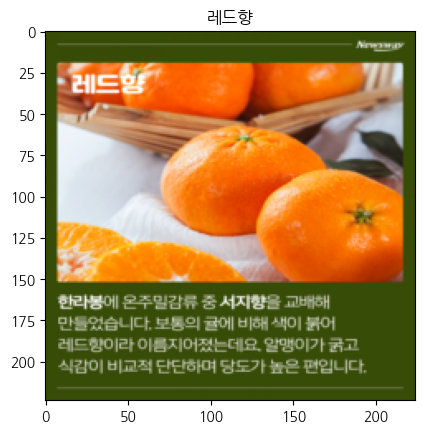

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


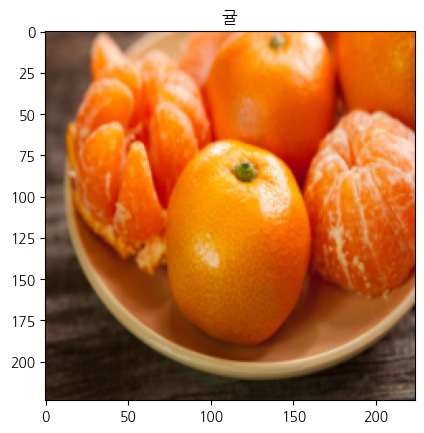

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


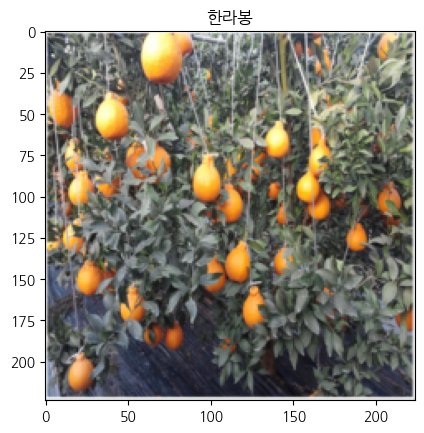

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


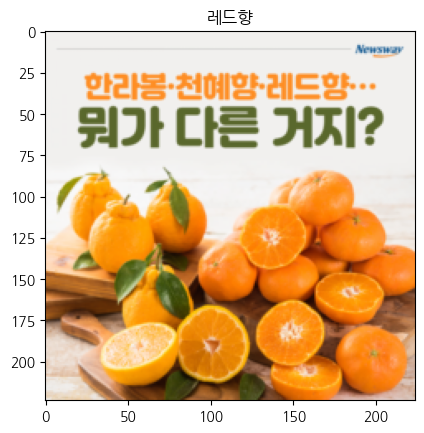

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


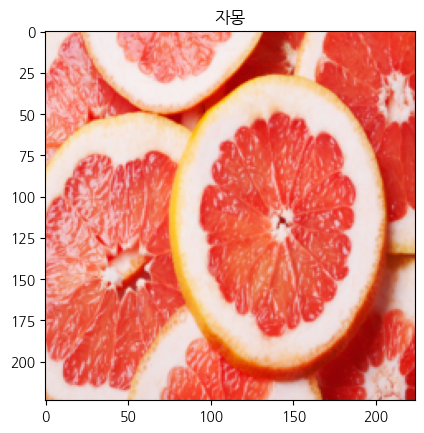

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


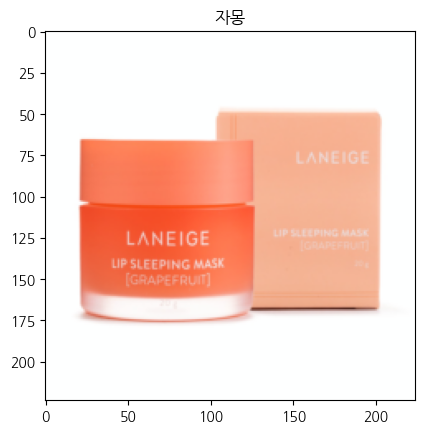

예측결과 : 천혜향  실제정답 : 레드향
(3, 224, 224)


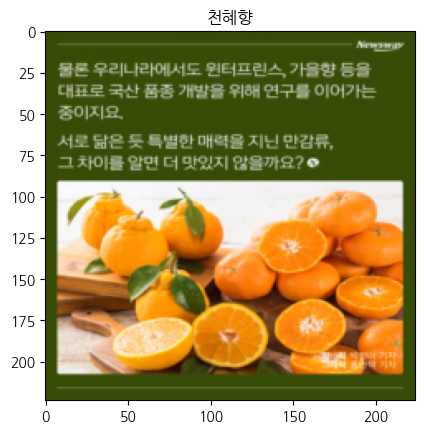

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


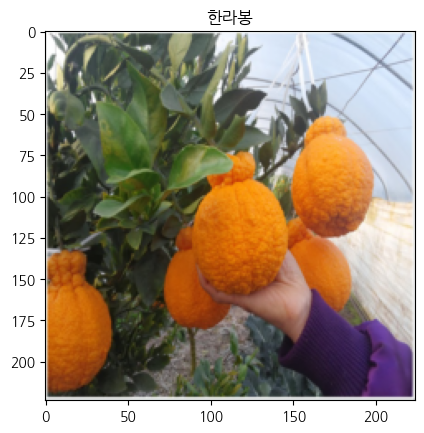

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


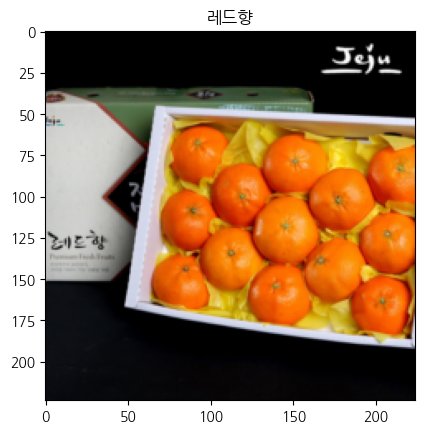

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


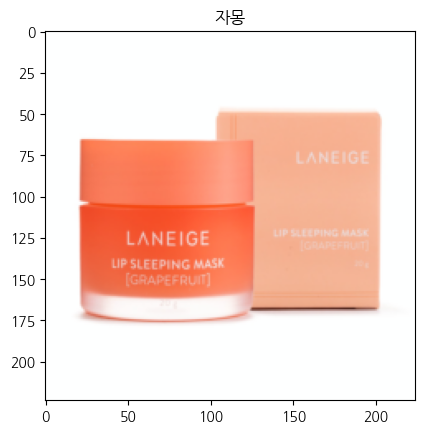

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


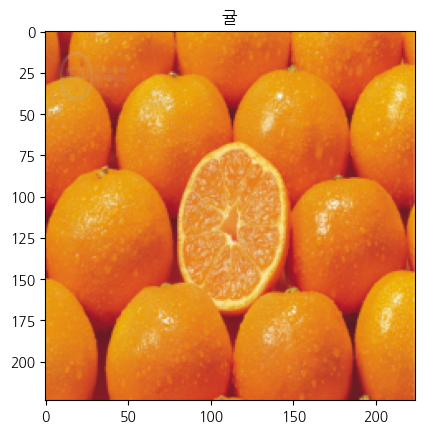

예측결과 : 레드향  실제정답 : 천혜향
(3, 224, 224)


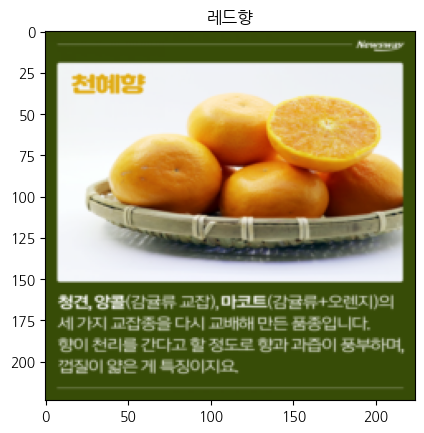

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


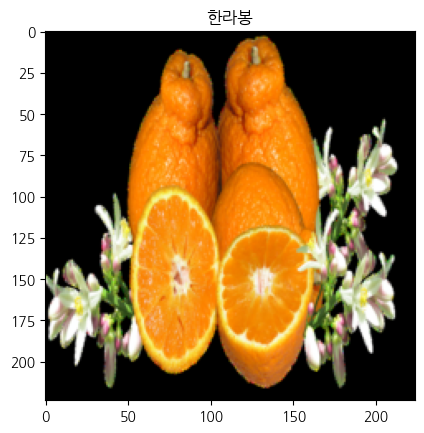

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


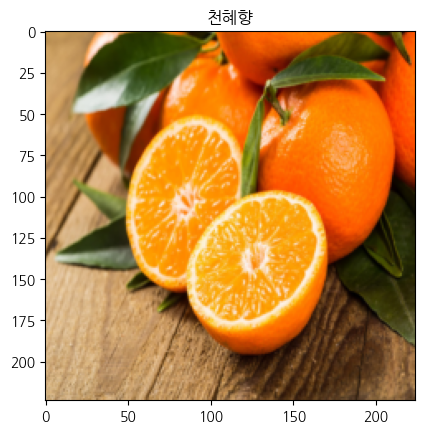

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


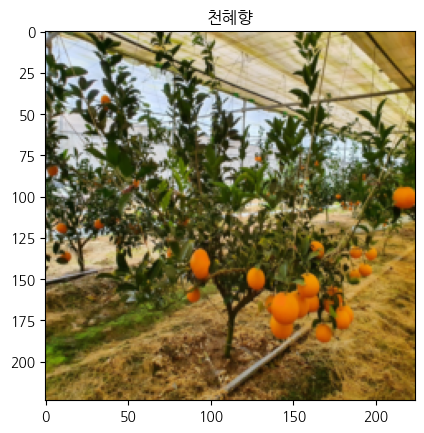

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


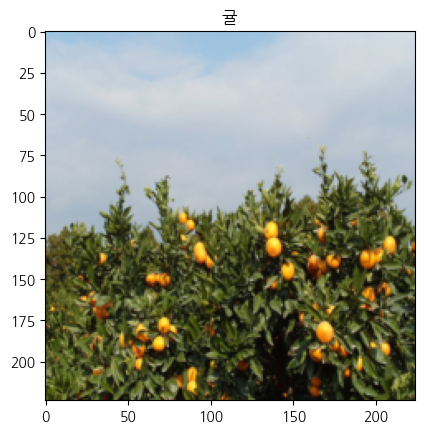

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


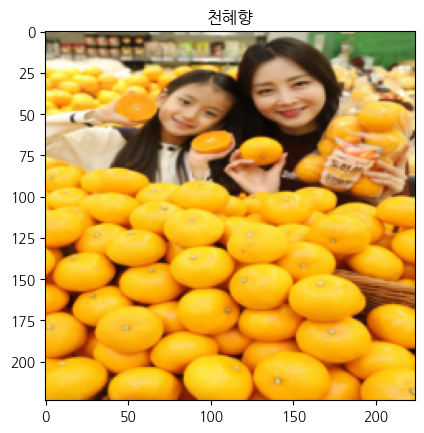

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


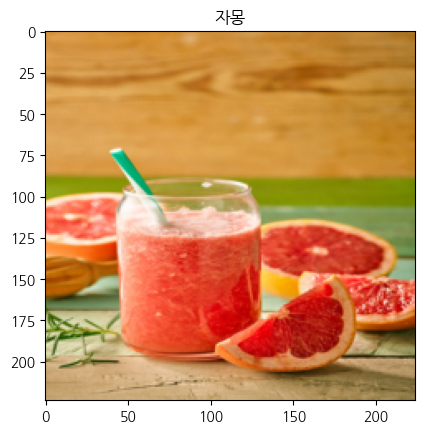

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


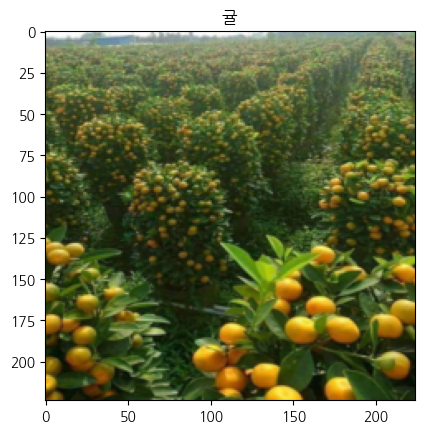

정확도 : 91.89189910888672


In [30]:
model.eval()

with torch.no_grad():
    corrects = 0
    for data,labels in test_dataloader:
        preds = model(data.to(device))
        pred = torch.max(preds,1)[1]

        corrects += torch.sum(pred == labels.to(device).data)

        print(f'예측결과 : {class_names[pred[0]]}  실제정답 : {class_names[labels.data[0]]}')
        imshow(data.cpu().data[0], title=class_names[pred[0]])

    acc = corrects / len(test_datasets) * 100
    print(f'정확도 : {acc}')

In [31]:
# 쓰기 종료
writer.close()

#코랩 안에서 띄우기위함
%load_ext tensorboard
#경로로 불러오기
%tensorboard --logdir=runs
# %tensorboard --logdir [경로] --port [포트번호]

<IPython.core.display.Javascript object>

In [32]:
torch.save(model.state_dict(),'orange-resnet34-version_2.pth')